In [1]:
using Pkg
Pkg.add("DataFrames")
Pkg.add("CSV")
Pkg.add("Statistics")
Pkg.add("MLDataUtils")
Pkg.add("Impute")
Pkg.add("Plots")
Pkg.add("Lathe")
Pkg.add("GLM")
Pkg.add("StatsPlots")
Pkg.add("MLBase")

using DataFrames
using CSV
using MLDataUtils
using Impute
using Plots
using Lathe
using GLM
using Statistics
using StatsPlots
using MLBase

┌ Warning: could not download https://pkg.julialang.org/registries
│   exception = RequestError: HTTP/2 301 (Cert verify failed: BADCERT_NOT_TRUSTED) while requesting https://pkg.julialang.org/registries
└ @ Pkg.Registry ~/julia-1.9.3/share/julia/stdlib/v1.9/Pkg/src/Registry/Registry.jl:69
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolv

## k-En Yakın Komşuluk Algoritması

In [62]:
bank= CSV.read("/home/ilke/Downloads/processed_data1.csv", DataFrame)

,age,job,marital,education,default,balance,housing,loan,contact
,Int64,String15,String15,String15,String3,Int64,String3,String3,String15
1,58,management,married,tertiary,no,2143,yes,no,unknown
2,44,technician,single,secondary,no,29,yes,no,unknown
3,33,entrepreneur,married,secondary,no,2,yes,yes,unknown
4,47,blue-collar,married,unknown,no,1506,yes,no,unknown
5,33,unknown,single,unknown,no,1,no,no,unknown
6,35,management,married,tertiary,no,231,yes,no,unknown
7,28,management,single,tertiary,no,447,yes,yes,unknown
8,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown
9,58,retired,married,primary,no,121,yes,no,unknown


In [63]:
Pkg.add("MLBase")
Pkg.add("NearestNeighbors")
Pkg.add("DataStructures")

using DataStructures
using NearestNeighbors
using MLBase

   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`


In [64]:
using Lathe.preprocess: TrainTestSplit
train,test=TrainTestSplit(bank,.60)

(27018×18 DataFrame
   Row │ age    job            marital   education  default  balance  housing  ⋯
       │ Int64  String15       String15  String15   String3  Int64    String3  ⋯
───────┼────────────────────────────────────────────────────────────────────────
     1 │    58  management     married   tertiary   no          2143  yes      ⋯
     2 │    44  technician     single    secondary  no            29  yes
     3 │    33  unknown        single    unknown    no             1  no
     4 │    42  entrepreneur   divorced  tertiary   yes            2  yes
     5 │    58  retired        married   primary    no           121  yes      ⋯
     6 │    41  admin.         divorced  secondary  no           270  yes
     7 │    29  admin.         single    secondary  no           390  yes
     8 │    53  technician     married   secondary  no             6  yes
     9 │    57  services       married   secondary  no           162  yes      ⋯
    10 │    57  blue-collar    married   primary   

In [65]:
#feature selection (Train)
features = Array(train[:,[:age, :balance, :duration, :campaign, :pdays, :previous]])
labels = Array(train[:,:y_numeric])
features = float.(features)
labels1=string.(labels)

27018-element Vector{String}:
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 ⋮
 "0"
 "1"
 "0"
 "1"
 "1"
 "0"
 "1"
 "1"
 "0"
 "1"
 "1"
 "1"

In [66]:
# feature_selection (Test)
features_test = Array(test[:,[:age, :balance, :duration, :campaign, :pdays, :previous]])
labels_test = Array(test[:,:y_numeric])
features_test = float.(features_test)
labels_test1=string.(labels_test)

18193-element Vector{String}:
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 "0"
 ⋮
 "1"
 "1"
 "1"
 "0"
 "1"
 "1"
 "1"
 "1"
 "1"
 "1"
 "0"
 "0"

In [67]:
kdtree=KDTree(features')

KDTree{StaticArraysCore.SVector{6, Float64}, Euclidean, Float64, StaticArraysCore.SVector{6, Float64}}
  Number of points: 27018
  Dimensions: 6
  Metric: Euclidean(0.0)
  Reordered: true

In [68]:
idxs,dists=knn(kdtree, features',5, true)

([[1, 14629, 11293, 8209, 1172], [2, 8124, 12232, 7444, 4352], [3, 14536, 20570, 9368, 21556], [4, 9819, 8990, 3229, 4681], [5, 13896, 6548, 18673, 2132], [6, 6099, 1759, 16491, 19514], [7, 1073, 11893, 15528, 23382], [8, 5558, 4663, 9841, 26975], [9, 7881, 3994, 12942, 13969], [10, 1886, 14086, 10618, 80]  …  [27009, 26546, 24428, 26232, 24695], [27010, 24673, 26492, 25842, 14873], [27011, 18084, 15476, 1709, 12314], [27012, 18407, 20093, 18245, 25642], [27013, 25905, 15101, 26215, 26294], [27014, 3704, 8560, 8282, 19653], [27015, 20937, 21184, 16664, 15254], [27016, 2904, 23029, 3834, 26448], [27017, 743, 3050, 10311, 7676], [27018, 26125, 26753, 22714, 22671]], [[0.0, 12.24744871391589, 19.6468827043885, 28.372521918222215, 29.614185789921695], [0.0, 3.1622776601683795, 5.0990195135927845, 5.385164807134504, 7.280109889280518], [0.0, 2.449489742783178, 2.449489742783178, 3.1622776601683795, 3.1622776601683795], [0.0, 2.23606797749979, 4.58257569495584, 5.0, 5.291502622129181], [0.0,

In [69]:
c=labels[hcat(idxs...)]

5×27018 Matrix{Int64}:
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  1  0  1  1  0  1  1  0  1  1  1
 0  0  0  0  0  0  0  0  0  0  0  0  1     0  0  1  1  0  0  0  0  1  1  0  1
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  1  1  0  1  0  0  0  1  0  1
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  1  1  0  0  1  0  0  0  0  1
 0  0  0  0  0  0  0  1  0  0  0  0  0     0  0  1  0  0  0  1  0  1  1  0  1

In [70]:
possible_labels=map(i->counter(c[:,i]),1:size(c,2))

27018-element Vector{Accumulator{Int64, Int64}}:
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 4, 1 => 1)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 5)
 Accumulator(0 => 4, 1 => 1)
 ⋮
 Accumulator(0 => 5)
 Accumulator(0 => 4, 1 => 1)
 Accumulator(0 => 1, 1 => 4)
 Accumulator(0 => 1, 1 => 4)
 Accumulator(0 => 4, 1 => 1)
 Accumulator(0 => 4, 1 => 1)
 Accumulator(0 => 2, 1 => 3)
 Accumulator(0 => 4, 1 => 1)
 Accumulator(0 => 3, 1 => 2)
 Accumulator(0 => 1, 1 => 4)
 Accumulator(0 => 4, 1 => 1)
 Accumulator(1 => 5)

In [71]:
predictions_NN = map(i -> parse(Int, string(argmax(possible_labels[i]))), 1:size(c, 2))

27018-element Vector{Int64}:
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 ⋮
 0
 0
 1
 1
 0
 0
 1
 0
 0
 1
 0
 1

In [33]:
accuracy(cm)=(cm.tp+cm.tn)/(c   Resolving packagem.tp+cm.tn+cm.fp+cm.fn)
specificity(cm)=cm.tn/(cm.tn+cm.fp)
precision(cm)=cm.tp/(cm.tp+cm.fp)
recall(cm)=cm.tp/(cm.tp+cm.fn)
F1score(cm)=2*cm.tp/(2*cm.tp+cm.fp+cm.fn)

F1score (generic function with 1 method)

In [72]:
confusion_matrix1=MLBase.roc(Array(labels),Array(predictions_NN))

ROCNums{Int64}
  p = 3191
  n = 23827
  tp = 1323
  tn = 23290
  fp = 537
  fn = 1868


In [73]:
println("Accuracy: ",accuracy(confusion_matrix1))
println("Specificity: ",specificity(confusion_matrix1))
println("Precision: ",precision(confusion_matrix1))
println("Recall: ",recall(confusion_matrix1))
println("F1Score: ",F1score(confusion_matrix1))

Accuracy: 0.9109852690798727
Specificity: 0.9774625424938096
Precision: 0.7112903225806452
Recall: 0.4146035725477907
F1Score: 0.5238566620471193


## k-ortalama kümeleme

In [74]:
Pkg.add("Clustering")
Pkg.add("Distances")

using Clustering
using Distances

   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`


In [75]:
features = collect(Matrix(bank[:, [:age, :balance, :duration, :campaign, :pdays, :previous]])')

6×45211 Matrix{Int64}:
   58   44  33    47   33   35   28   42  …   25   51    71    72   57    37
 2143   29   2  1506    1  231  447    2     505  825  1729  5715  668  2971
  261  151  76    92  198  139  217  380     386  977   456  1127  508   361
    1    1   1     1    1    1    1    1       2    3     2     5    4     2
   -1   -1  -1    -1   -1   -1   -1   -1      -1   -1    -1   184   -1   188
    0    0   0     0    0    0    0    0  …    0    0     0     3    0    11

In [76]:
result = kmeans(features, 7, display=:iter)

  Iters               objv        objv-change | affected 
-------------------------------------------------------------
      0       5.556152e+10
      1       3.749763e+10      -1.806389e+10 |        7
      2       3.509139e+10      -2.406241e+09 |        7
      3       3.430197e+10      -7.894180e+08 |        7
      4       3.379714e+10      -5.048296e+08 |        7
      5       3.335434e+10      -4.427951e+08 |        7
      6       3.280747e+10      -5.468723e+08 |        7
      7       3.226874e+10      -5.387315e+08 |        7
      8       3.196527e+10      -3.034700e+08 |        7
      9       3.164997e+10      -3.153024e+08 |        6
     10       3.133925e+10      -3.107161e+08 |        6
     11       3.107582e+10      -2.634304e+08 |        6
     12       3.078144e+10      -2.943832e+08 |        6
     13       3.052024e+10      -2.612020e+08 |        6
     14       3.030616e+10      -2.140759e+08 |        6
     15       3.013480e+10      -1.713648e+08 |        

KmeansResult{Matrix{Float64}, Float64, Int64}([40.054664528201016 45.375 … 43.254641909814325 42.15653577192039; 216.97146484897087 25806.18181818182 … 4013.702122015915 1655.2391608391608; … ; 38.95419005613472 35.73863636363637 … 39.46923076923077 44.51629908552985; 0.5297380379577653 0.5056818181818182 … 0.6811671087533157 0.6777837547068316], [7, 1, 1, 7, 1, 1, 1, 1, 1, 1  …  1, 1, 1, 6, 1, 1, 7, 6, 1, 6], [240322.6479146704, 46921.09588174008, 78438.97773151286, 56154.58261074312, 51087.722585829906, 14335.283264792728, 55804.98681999184, 64493.221516597085, 51477.8321821945, 181367.79462539149  …  155816.22051419131, 117977.5480335711, 12930.048167225264, 1.3556788238754198e6, 103046.80030569091, 898692.3170792809, 42836.9466774473, 3.6388559124695957e6, 271432.1090466692, 1.1165123994722366e6], [29928, 176, 518, 23, 1501, 3770, 9295], [29928, 176, 518, 23, 1501, 3770, 9295], 2.9027953969529705e10, 77, true)

In [77]:
result.centers

6×7 Matrix{Float64}:
  40.0547       45.375        43.2954    …    43.2546      42.1565
 216.971     25806.2       13773.8          4013.7       1655.24
 250.861       248.057       265.884         276.873      270.28
   2.82428       2.67045       2.64672         2.65093      2.63593
  38.9542       35.7386       38.6429         39.4692      44.5163
   0.529738      0.505682      0.683398  …     0.681167     0.677784

In [78]:
result.counts

7-element Vector{Int64}:
 29928
   176
   518
    23
  1501
  3770
  9295

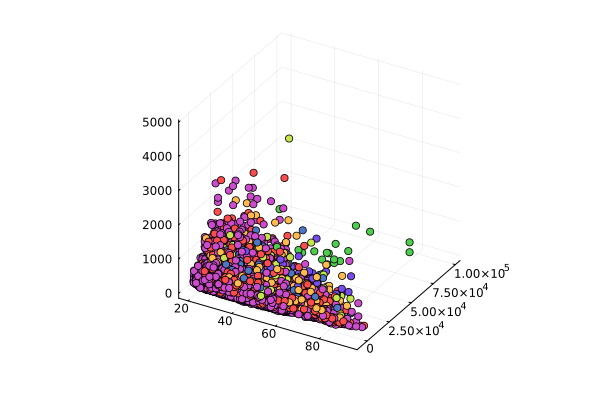

In [79]:
# plot with the point color mapped to the assigned cluster index
scatter(bank.age, bank.balance, bank.duration, marker_z=result.assignments,
        color=:lightrainbow, legend=false)